In [1]:
!pip install -q timm
print("✅ timm đã sẵn sàng!")

✅ timm đã sẵn sàng!


In [2]:
# =============================================================================
# CELL 2: TÌM DATASET + KIỂM TRA PHÂN BỐ
# =============================================================================
import os, glob, json

json_candidates = glob.glob("/kaggle/input/**/dataset_labels.json", recursive=True)
if not json_candidates:
    json_candidates = glob.glob("/kaggle/input/**/*.json", recursive=True)
assert len(json_candidates) > 0, "❌ Chưa tìm thấy dataset_labels.json!"
JSON_PATH = json_candidates[0]

with open(JSON_PATH, "r", encoding="utf-8") as f:
    raw_data = json.load(f)

n_fire = sum(1 for d in raw_data if d.get("has_fire") == 1)
n_nofire = len(raw_data) - n_fire
print(f"📄 File nhãn: {JSON_PATH}")
print(f"📊 Tổng: {len(raw_data)} | 🔥 Lửa: {n_fire} | 🌿 Không: {n_nofire} | Tỷ lệ: {n_fire/max(1,n_nofire):.1f}:1")

📄 File nhãn: /kaggle/input/datasets/padang2/fire-ground-dataset/dataset_labels.json
📊 Tổng: 6500 | 🔥 Lửa: 4509 | 🌿 Không: 1991 | Tỷ lệ: 2.3:1


In [3]:
# =============================================================================
# CELL 3: TOÀN BỘ SETUP — Model, Loss, Dataset, DataLoader
# =============================================================================
import os, glob, json, random, math, time
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms.functional as TF
from PIL import Image
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🚀 Device: {device.upper()}")

# ╔═══════════════════════════════════════════════════════════╗
# ║               CẤU HÌNH — ĐỔI Ở ĐÂY                     ║
# ╚═══════════════════════════════════════════════════════════╝
BACKBONE     = "mobilenetv4_conv_medium"
IMG_SIZE     = 256
EPOCHS       = 50
LR           = 1.5e-4
BATCH        = 48
PATIENCE     = 7
W_CLS        = 1.5
W_REG        = 3.0
WD           = 3e-4
FOCAL_ALPHA  = 0.5
FOCAL_GAMMA  = 2.0

json_candidates = glob.glob("/kaggle/input/**/dataset_labels.json", recursive=True)
if not json_candidates:
    json_candidates = glob.glob("/kaggle/input/**/*.json", recursive=True)
if not json_candidates:
    json_candidates = glob.glob("./**/dataset_labels*.json", recursive=True)
JSON_PATH = json_candidates[0]
print(f"📄 Dataset: {JSON_PATH}")

# Cache đường dẫn ảnh
all_imgs_map = {}
search_dirs = ["/kaggle/input", "."]
for s_dir in search_dirs:
    if os.path.exists(s_dir):
        for root, _, files in os.walk(s_dir):
            for f in files:
                if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                    all_imgs_map[f] = os.path.join(root, f)
print(f"📂 Index: {len(all_imgs_map)} ảnh đã được lập chỉ mục")

MEAN, STD = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]


# ── FOCAL LOSS ────────────────────────────────────────────────────────────────
class FocalLoss(nn.Module):
    """
    Focal Loss: giảm loss cho easy examples, focus hard examples.
    γ=2.0: easy (p=0.95) giảm ~400×, hard (p=0.55) giảm ~5×
    α=0.5: cân bằng pos/neg
    """
    def __init__(self, alpha=0.5, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, pred, target):
        pred = pred.clamp(1e-6, 1.0 - 1e-6)
        bce = F.binary_cross_entropy(pred, target, reduction='none')
        pt = torch.where(target > 0.5, pred, 1.0 - pred)
        alpha_t = torch.where(target > 0.5, self.alpha, 1.0 - self.alpha)
        focal_weight = alpha_t * (1.0 - pt) ** self.gamma
        return (focal_weight * bce).mean()


# ── DUAL-HEAD MODEL ───────────────────────────────────────────────────────────
class FireGrounderV2(nn.Module):
    """
    Dual Head: cls_head và reg_head RIÊNG BIỆT → không gradient conflict.
    cls_head: Dropout 0.4 + BatchNorm → chống false positive trên ảnh không lửa
    reg_head: Dropout 0.2 + BatchNorm → giữ độ chính xác tọa độ gốc lửa
    """
    def __init__(self, backbone_name=BACKBONE, pretrained=True):
        super().__init__()
        self.backbone = timm.create_model(
            backbone_name, pretrained=pretrained,
            num_classes=0, global_pool="avg"
        )
        self.backbone.eval()
        with torch.no_grad():
            n = self.backbone(torch.randn(2, 3, IMG_SIZE, IMG_SIZE)).shape[-1]
        self.backbone.train()

        self.cls_head = nn.Sequential(
            nn.Linear(n, 256),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(0.4),
            nn.Linear(256, 1),
        )
        self.reg_head = nn.Sequential(
            nn.Linear(n, 256),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(0.2),
            nn.Linear(256, 2),
        )
        total = sum(p.numel() for p in self.parameters())
        print(f"✨ FireGrounderV2 | {backbone_name} | features={n} | params={total:,}")

    def forward(self, x):
        feat = self.backbone(x)
        p_fire = torch.sigmoid(self.cls_head(feat))
        xy = torch.sigmoid(self.reg_head(feat))
        return torch.cat([p_fire, xy], dim=1)


# ── COMBINED LOSS ─────────────────────────────────────────────────────────────
class FireLossV2(nn.Module):
    def __init__(self, w_cls=W_CLS, w_reg=W_REG):
        super().__init__()
        self.w_cls = w_cls
        self.w_reg = w_reg
        self.focal = FocalLoss(alpha=FOCAL_ALPHA, gamma=FOCAL_GAMMA)
        self.sl1 = nn.SmoothL1Loss()

    def forward(self, preds, targets):
        cls_loss = self.focal(preds[:, 0], targets[:, 0])
        fire_mask = targets[:, 0] > 0.5
        if fire_mask.any():
            reg_loss = self.sl1(preds[fire_mask, 1:], targets[fire_mask, 1:])
        else:
            reg_loss = torch.tensor(0.0, device=preds.device)
        return self.w_cls * cls_loss + self.w_reg * reg_loss, cls_loss, reg_loss


# ── DATASET V2 ────────────────────────────────────────────────────────────────
class FireDatasetV2(Dataset):
    """
    Augmentation mạnh: coord-safe HFlip, RandomErasing, ColorJitter mạnh, Gamma.
    """
    def __init__(self, json_path, split="train", val_ratio=0.15, seed=42):
        with open(json_path, encoding="utf-8") as f:
            all_data = json.load(f)
        random.seed(seed)
        idx = list(range(len(all_data)))
        random.shuffle(idx)
        n_val = max(1, int(len(all_data) * val_ratio))
        self.data = ([all_data[i] for i in idx[:n_val]] if split == "val"
                     else [all_data[i] for i in idx[n_val:]])
        self.split = split
        self.color_jitter = transforms.ColorJitter(
            brightness=0.4, contrast=0.4, saturation=0.3, hue=0.08
        )
        self.random_erasing = transforms.RandomErasing(
            p=0.25, scale=(0.02, 0.15), ratio=(0.3, 3.3), value='random'
        )
        self.normalize = transforms.Normalize(MEAN, STD)
        n_fire = sum(1 for d in self.data if d.get("has_fire", 1) == 1)
        print(f"  [{split.upper():5s}] {len(self.data)} mẫu "
              f"(Lửa={n_fire}, Không={len(self.data)-n_fire})")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, i):
        item = self.data[i]
        path = item["image_path"]
        if not os.path.exists(path):
            path = all_imgs_map.get(os.path.basename(path), path)
        img = Image.open(path).convert("RGB")
        has_fire = float(item.get("has_fire", 1))
        x, y = item.get("p_fire", [0.0, 0.0]) if has_fire == 1.0 else (0.0, 0.0)

        if self.split == "train":
            img = self.color_jitter(img)
            if random.random() < 0.5:
                img = TF.hflip(img)
                if has_fire > 0.5:
                    x = 1.0 - x
            if random.random() < 0.3:
                gamma = random.uniform(0.7, 1.4)
                img = TF.adjust_gamma(img, gamma)

        img = TF.resize(img, [IMG_SIZE, IMG_SIZE])
        img = TF.to_tensor(img)
        if self.split == "train":
            img = self.random_erasing(img)
        img = self.normalize(img)
        return img, torch.tensor([has_fire, x, y], dtype=torch.float32)


# ── Khởi tạo ──────────────────────────────────────────────────────────────────
print("\n📦 Dataset V2:")
train_ds = FireDatasetV2(JSON_PATH, "train", 0.15)
val_ds   = FireDatasetV2(JSON_PATH, "val",   0.15)
train_dl = DataLoader(train_ds, BATCH, shuffle=True,  num_workers=2, pin_memory=True, drop_last=True)
val_dl   = DataLoader(val_ds,   BATCH, shuffle=False, num_workers=2, pin_memory=True)

print("\n🧠 Model V2:")
model     = FireGrounderV2(BACKBONE, pretrained=True).to(device)
criterion = FireLossV2(w_cls=W_CLS, w_reg=W_REG)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WD)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

print(f"\n⚙️ Config: {BACKBONE} | {IMG_SIZE}px | Focal(α={FOCAL_ALPHA},γ={FOCAL_GAMMA})")
print(f"   w_cls={W_CLS} w_reg={W_REG} | AdamW(lr={LR}, wd={WD}) | EarlyStop={PATIENCE}")

🚀 Device: CUDA
📄 Dataset: /kaggle/input/datasets/padang2/fire-ground-dataset/dataset_labels.json
📂 Index: 6510 ảnh đã được lập chỉ mục

📦 Dataset V2:
  [TRAIN] 5525 mẫu (Lửa=3840, Không=1685)
  [VAL  ] 975 mẫu (Lửa=669, Không=306)

🧠 Model V2:


model.safetensors:   0%|          | 0.00/39.2M [00:00<?, ?B/s]

✨ FireGrounderV2 | mobilenetv4_conv_medium | features=1280 | params=9,092,179

⚙️ Config: mobilenetv4_conv_medium | 256px | Focal(α=0.5,γ=2.0)
   w_cls=1.5 w_reg=3.0 | AdamW(lr=0.00015, wd=0.0003) | EarlyStop=7


In [4]:
# =============================================================================
# CELL 4: HUẤN LUYỆN V2 VỚI EARLY STOPPING + METRICS ĐẦY ĐỦ
# =============================================================================
best_val = float("inf")
patience_counter = 0
SAVE_DIR = "/kaggle/working" if os.path.exists("/kaggle/working") else "."
BEST_PATH = os.path.join(SAVE_DIR, "best_v2_mnv4.pth")
history = []

print(f"\n🏁 HUẤN LUYỆN V2 — {BACKBONE} | Focal | Dual Head | {IMG_SIZE}px | EarlyStop={PATIENCE}")
print("=" * 105)
print(f"{'Ep':>3} {'Train':>8} {'Val':>8} {'Focal':>8} {'Reg':>8} "
      f"{'Prec':>6} {'Rec':>6} {'F1':>6} {'FP':>4} {'FN':>4} {'MAE_px':>7} {'LR':>10} {'Status'}")
print("-" * 105)

t_start = time.time()

for epoch in range(1, EPOCHS + 1):
    # ═══ TRAIN ═══
    model.train()
    total_train = 0.0
    for imgs, labels in tqdm(train_dl, desc=f"Ep {epoch:02d}", leave=False):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        loss, _, _ = criterion(model(imgs), labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        total_train += loss.item() * imgs.size(0)
    scheduler.step()
    train_loss = total_train / len(train_ds)

    # ═══ EVAL ═══
    model.eval()
    total_val = total_cls = total_reg = 0.0
    coord_errs = []
    all_preds, all_labels = [], []

    with torch.no_grad():
        for imgs, labels in val_dl:
            imgs, labels = imgs.to(device), labels.to(device)
            preds = model(imgs)
            loss, cl, rl = criterion(preds, labels)
            total_val += loss.item() * imgs.size(0)
            total_cls += cl.item() * imgs.size(0)
            total_reg += rl.item() * imgs.size(0)
            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())
            fire_m = labels[:, 0] > 0.5
            if fire_m.any():
                coord_errs.append(torch.norm(preds[fire_m, 1:] - labels[fire_m, 1:], dim=1).mean().item())

    val_loss = total_val / len(val_ds)
    cls_l = total_cls / len(val_ds)
    reg_l = total_reg / len(val_ds)
    coord_err = sum(coord_errs) / len(coord_errs) if coord_errs else 0.0
    lr_now = scheduler.get_last_lr()[0]

    # ═══ METRICS ═══
    P = torch.cat(all_preds)
    L = torch.cat(all_labels)
    pred_fire = P[:, 0] > 0.5
    true_fire = L[:, 0] > 0.5
    tp = (pred_fire & true_fire).sum().item()
    fp = (pred_fire & ~true_fire).sum().item()
    fn = (~pred_fire & true_fire).sum().item()
    tn = (~pred_fire & ~true_fire).sum().item()
    prec = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    rec = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0.0

    fire_m = L[:, 0] > 0.5
    if fire_m.any():
        mae_px = (P[fire_m, 1:] - L[fire_m, 1:]).abs().pow(2).sum(dim=1).sqrt().mean().item() * IMG_SIZE
    else:
        mae_px = 0.0

    history.append({
        "epoch": epoch, "train": train_loss, "val": val_loss,
        "cls": cls_l, "reg": reg_l, "coord_err": coord_err, "mae_px": mae_px,
        "precision": prec, "recall": rec, "f1": f1,
        "tp": tp, "fp": fp, "fn": fn, "tn": tn, "lr": lr_now
    })

    # ═══ EARLY STOPPING ═══
    if val_loss < best_val:
        best_val = val_loss
        patience_counter = 0
        torch.save({
            "epoch": epoch, "model_state_dict": model.state_dict(),
            "backbone": BACKBONE, "img_size": IMG_SIZE,
            "val_loss": val_loss, "precision": prec, "recall": rec, "f1": f1,
            "coord_err": coord_err, "mae_px": mae_px,
            "tp": tp, "fp": fp, "fn": fn, "tn": tn, "history": history,
        }, BEST_PATH)
        status = f"⭐ BEST | P={prec:.3f} R={rec:.3f} F1={f1:.3f} MAE={mae_px:.1f}px"
    else:
        patience_counter += 1
        status = f"  wait {patience_counter}/{PATIENCE}"
        if patience_counter >= PATIENCE:
            status += " → 🛑 STOP!"

    print(f"{epoch:>3} {train_loss:>8.4f} {val_loss:>8.4f} {cls_l:>8.5f} {reg_l:>8.5f} "
          f"{prec:>6.3f} {rec:>6.3f} {f1:>6.3f} {fp:>4} {fn:>4} {mae_px:>7.1f} "
          f"{lr_now:>10.2e} {status}")

    if patience_counter >= PATIENCE:
        print(f"\n🛑 Early Stopping kích hoạt! Mô hình tốt nhất ở epoch: {epoch - PATIENCE}")
        break

elapsed = (time.time() - t_start) / 60
print("=" * 105)
print(f"🎉 Hoàn thành huấn luyện trong {elapsed:.1f} phút! Best val={best_val:.5f}")
print(f"📁 Đã lưu model tốt nhất tại: {BEST_PATH}")

with open(os.path.join(SAVE_DIR, "train_history_v2.json"), "w") as f:
    json.dump(history, f, indent=2)

try:
    from IPython.display import FileLink, display
    display(FileLink(os.path.basename(BEST_PATH)))
    display(FileLink("train_history_v2.json"))
except Exception:
    pass



🏁 HUẤN LUYỆN V2 — mobilenetv4_conv_medium | Focal | Dual Head | 256px | EarlyStop=7
 Ep    Train      Val    Focal      Reg   Prec    Rec     F1   FP   FN  MAE_px         LR Status
---------------------------------------------------------------------------------------------------------


  1   0.1052   0.1255  0.06241  0.01065  0.974  0.937  0.955   17   42    44.0   1.50e-04 ⭐ BEST | P=0.974 R=0.937 F1=0.955 MAE=44.0px


  2   0.0527   0.0432  0.01776  0.00551  0.943  0.994  0.968   40    4    31.6   1.49e-04 ⭐ BEST | P=0.943 R=0.994 F1=0.968 MAE=31.6px


  3   0.0354   0.0340  0.01421  0.00424  0.977  0.973  0.975   15   18    27.0   1.49e-04 ⭐ BEST | P=0.977 R=0.973 F1=0.975 MAE=27.0px


  4   0.0281   0.0302  0.01424  0.00294  0.965  0.990  0.977   24    7    21.3   1.48e-04 ⭐ BEST | P=0.965 R=0.990 F1=0.977 MAE=21.3px


  5   0.0231   0.0222  0.00980  0.00251  0.978  0.991  0.984   15    6    20.2   1.46e-04 ⭐ BEST | P=0.978 R=0.991 F1=0.984 MAE=20.2px


  6   0.0214   0.0272  0.01370  0.00221  0.974  0.993  0.983   18    5    18.2   1.45e-04   wait 1/7


  7   0.0178   0.0342  0.01845  0.00219  0.974  0.990  0.981   18    7    18.8   1.43e-04   wait 2/7


  8   0.0150   0.0237  0.01269  0.00155  0.975  0.994  0.984   17    4    15.3   1.41e-04   wait 3/7


  9   0.0125   0.0289  0.01607  0.00158  0.981  0.985  0.983   13   10    14.8   1.38e-04   wait 4/7


 10   0.0104   0.0275  0.01590  0.00121  0.974  0.994  0.984   18    4    13.6   1.36e-04   wait 5/7


 11   0.0124   0.0199  0.01066  0.00132  0.976  0.993  0.984   16    5    13.5   1.33e-04 ⭐ BEST | P=0.976 R=0.993 F1=0.984 MAE=13.5px


 12   0.0092   0.0227  0.01237  0.00137  0.977  0.996  0.986   16    3    14.1   1.30e-04   wait 1/7


 13   0.0082   0.0220  0.01224  0.00120  0.975  0.997  0.986   17    2    12.4   1.26e-04   wait 2/7


 14   0.0091   0.0200  0.01104  0.00114  0.977  0.999  0.987   16    1    12.4   1.23e-04   wait 3/7


 15   0.0079   0.0272  0.01553  0.00131  0.978  0.997  0.987   15    2    12.8   1.19e-04   wait 4/7


 16   0.0070   0.0301  0.01792  0.00107  0.977  0.997  0.987   16    2    12.0   1.15e-04   wait 5/7


 17   0.0080   0.0278  0.01644  0.00106  0.975  0.994  0.984   17    4    11.8   1.11e-04   wait 6/7


 18   0.0061   0.0250  0.01450  0.00108  0.979  0.994  0.987   14    4    11.4   1.07e-04   wait 7/7 → 🛑 STOP!

🛑 Early Stopping kích hoạt! Mô hình tốt nhất ở epoch: 11
🎉 Hoàn thành huấn luyện trong 106.5 phút! Best val=0.01995
📁 Đã lưu model tốt nhất tại: /kaggle/working/best_v2_mnv4.pth


/kaggle/working/best_v2_mnv4.pth

/kaggle/working/train_history_v2.json

📦 Best model epoch 11 | Val=0.01995 | P=0.976 R=0.993 F1=0.984 | FP=16 FN=5 | MAE=13.5px

📊 V2 TEST — 24 ẢNH NGẪU NHIÊN:
  Acc=100% | P=1.000 R=1.000 F1=1.000 | FP=0 FN=0
  MAE=13.0px | Median=12.4px | ≤15px: 72%
  Min=4.3px Max=25.7px


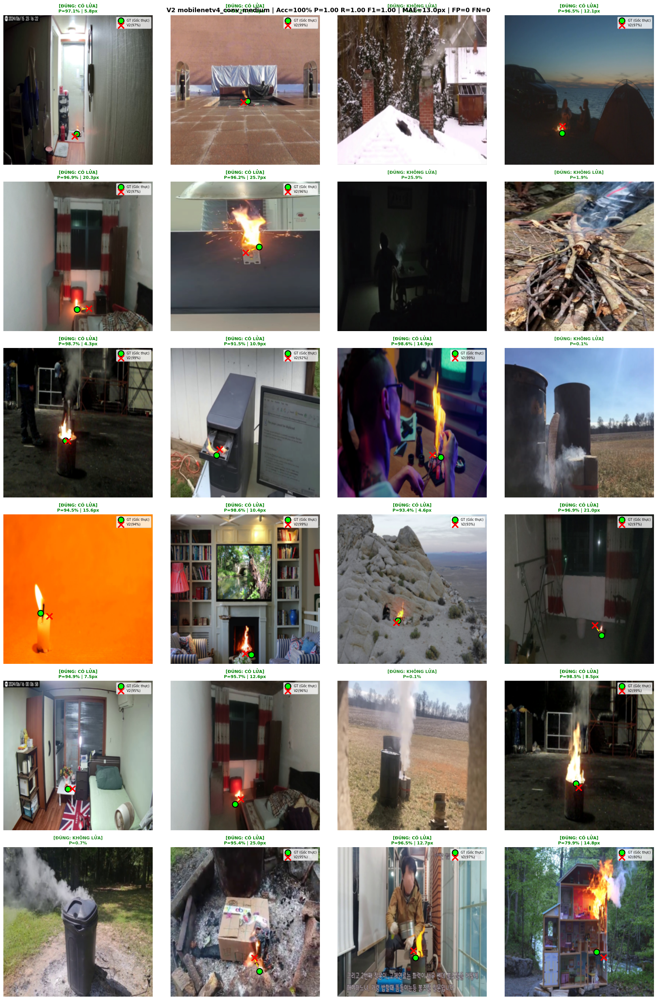

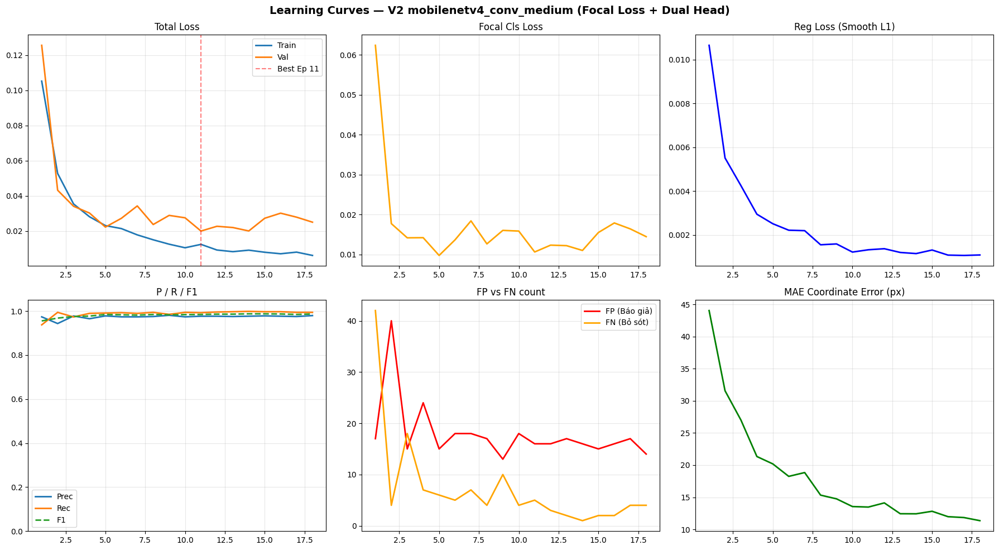

/kaggle/working/v2_val_preview.png

/kaggle/working/v2_curves.png

In [5]:
# =============================================================================
# CELL 5: ĐÁNH GIÁ 24 ẢNH VAL + LEARNING CURVES
# =============================================================================
import math, random
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

ckpt = torch.load(BEST_PATH, map_location=device)
model.load_state_dict(ckpt["model_state_dict"])
model.eval()
print(f"📦 Best model epoch {ckpt['epoch']} | Val={ckpt['val_loss']:.5f} "
      f"| P={ckpt['precision']:.3f} R={ckpt['recall']:.3f} F1={ckpt['f1']:.3f} "
      f"| FP={ckpt['fp']} FN={ckpt['fn']} | MAE={ckpt['mae_px']:.1f}px")

NUM_TEST = min(24, len(val_ds))
random.seed(999)
test_idx = random.sample(range(len(val_ds)), NUM_TEST)
results = []
pixel_devs = []
tp = fp = tn = fn = 0

with torch.no_grad():
    for idx in test_idx:
        img_t, lbl = val_ds[idx]
        pred = model(img_t.unsqueeze(0).to(device)).squeeze(0).cpu()
        gt_f = int(lbl[0].item() > 0.5)
        gt_x, gt_y = lbl[1].item() * IMG_SIZE, lbl[2].item() * IMG_SIZE
        pf = pred[0].item()
        prd_f = int(pf >= 0.5)
        px, py = pred[1].item() * IMG_SIZE, pred[2].item() * IMG_SIZE

        dev = None
        if gt_f == 1 and prd_f == 1:
            tp += 1
            s, c = "ĐÚNG: CÓ LỬA", "green"
            dev = math.sqrt((px - gt_x)**2 + (py - gt_y)**2)
            pixel_devs.append(dev)
        elif gt_f == 0 and prd_f == 0:
            tn += 1
            s, c = "ĐÚNG: KHÔNG LỬA", "forestgreen"
        elif gt_f == 0 and prd_f == 1:
            fp += 1
            s, c = "❌ FP (BÁO GIẢ)", "red"
        else:
            fn += 1
            s, c = "❌ FN (BỎ SÓT)", "darkorange"

        results.append({
            "img_t": img_t, "gt_fire": gt_f, "gt_pos": (gt_x, gt_y),
            "pred_fire": prd_f, "pred_pos": (px, py),
            "p_fire": pf, "status": s, "color": c, "dev_px": dev
        })

acc = (tp + tn) / NUM_TEST * 100
md = np.mean(pixel_devs) if pixel_devs else 0
mdd = np.median(pixel_devs) if pixel_devs else 0
gr = (sum(1 for d in pixel_devs if d <= 15) / len(pixel_devs) * 100) if pixel_devs else 0
pr = tp / (tp + fp) if (tp + fp) > 0 else 0
rc = tp / (tp + fn) if (tp + fn) > 0 else 0
f1v = 2 * pr * rc / (pr + rc) if (pr + rc) > 0 else 0

print("\n" + "=" * 70)
print(f"📊 V2 TEST — {NUM_TEST} ẢNH NGẪU NHIÊN:")
print(f"  Acc={acc:.0f}% | P={pr:.3f} R={rc:.3f} F1={f1v:.3f} | FP={fp} FN={fn}")
print(f"  MAE={md:.1f}px | Median={mdd:.1f}px | ≤15px: {gr:.0f}%")
if pixel_devs:
    print(f"  Min={min(pixel_devs):.1f}px Max={max(pixel_devs):.1f}px")
print("=" * 70)

# Vẽ 24 ảnh
cols = 4
rows = (NUM_TEST + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()
inv_mean = [-m / s for m, s in zip(MEAN, STD)]
inv_std = [1.0 / s for s in STD]
inv_tfm = transforms.Compose([transforms.Normalize(inv_mean, inv_std)])

for i, r in enumerate(results):
    disp = inv_tfm(r["img_t"]).permute(1, 2, 0).numpy().clip(0, 1)
    axes[i].imshow(disp)
    if r["gt_fire"] == 1:
        axes[i].scatter(*r["gt_pos"], color="lime", s=150, edgecolors="black", linewidth=2, label="GT (Gốc thực)", zorder=4)
    if r["pred_fire"] == 1:
        axes[i].scatter(*r["pred_pos"], color="red", s=160, marker="x", linewidth=3, label=f"V2({r['p_fire']*100:.0f}%)", zorder=5)
    if r["dev_px"] is not None:
        axes[i].plot([r["gt_pos"][0], r["pred_pos"][0]], [r["gt_pos"][1], r["pred_pos"][1]],
                     color="yellow", linestyle="--", linewidth=2, zorder=3)
        ext = f" | {r['dev_px']:.1f}px"
    else:
        ext = ""
    axes[i].set_title(f"[{r['status']}]\nP={r['p_fire']*100:.1f}%{ext}", fontsize=9, fontweight="bold", color=r["color"])
    axes[i].axis("off")
    if r["gt_fire"] == 1 or r["pred_fire"] == 1:
        axes[i].legend(loc="upper right", fontsize=7)

for j in range(NUM_TEST, len(axes)):
    axes[j].axis("off")

plt.suptitle(f"V2 {BACKBONE} | Acc={acc:.0f}% P={pr:.2f} R={rc:.2f} F1={f1v:.2f} | MAE={md:.1f}px | FP={fp} FN={fn}", fontsize=13, fontweight="bold")
plt.tight_layout()
preview_save_path = os.path.join(SAVE_DIR, "v2_val_preview.png")
plt.savefig(preview_save_path, dpi=130, bbox_inches="tight")
plt.show()

# Learning Curves
hist = history if 'history' in dir() and len(history) > 0 else ckpt.get("history", [])
if hist:
    fig2, ax2 = plt.subplots(2, 3, figsize=(18, 10))
    ep = [h["epoch"] for h in hist]
    ax2[0, 0].plot(ep, [h["train"] for h in hist], label="Train", lw=2)
    ax2[0, 0].plot(ep, [h["val"] for h in hist], label="Val", lw=2)
    ax2[0, 0].axvline(ckpt["epoch"], color="red", ls="--", alpha=0.5, label=f"Best Ep {ckpt['epoch']}")
    ax2[0, 0].set_title("Total Loss"); ax2[0, 0].legend(); ax2[0, 0].grid(alpha=0.3)

    ax2[0, 1].plot(ep, [h["cls"] for h in hist], color="orange", lw=2)
    ax2[0, 1].set_title("Focal Cls Loss"); ax2[0, 1].grid(alpha=0.3)

    ax2[0, 2].plot(ep, [h["reg"] for h in hist], color="blue", lw=2)
    ax2[0, 2].set_title("Reg Loss (Smooth L1)"); ax2[0, 2].grid(alpha=0.3)

    ax2[1, 0].plot(ep, [h["precision"] for h in hist], label="Prec", lw=2)
    ax2[1, 0].plot(ep, [h["recall"] for h in hist], label="Rec", lw=2)
    ax2[1, 0].plot(ep, [h["f1"] for h in hist], label="F1", lw=2, ls="--")
    ax2[1, 0].set_title("P / R / F1"); ax2[1, 0].legend(); ax2[1, 0].grid(alpha=0.3); ax2[1, 0].set_ylim(0.0, 1.05)

    ax2[1, 1].plot(ep, [h["fp"] for h in hist], label="FP (Báo giả)", color="red", lw=2)
    ax2[1, 1].plot(ep, [h["fn"] for h in hist], label="FN (Bỏ sót)", color="orange", lw=2)
    ax2[1, 1].set_title("FP vs FN count"); ax2[1, 1].legend(); ax2[1, 1].grid(alpha=0.3)

    ax2[1, 2].plot(ep, [h["mae_px"] for h in hist], color="green", lw=2)
    ax2[1, 2].set_title("MAE Coordinate Error (px)"); ax2[1, 2].grid(alpha=0.3)

    plt.suptitle(f"Learning Curves — V2 {BACKBONE} (Focal Loss + Dual Head)", fontsize=14, fontweight="bold")
    plt.tight_layout()
    curves_save_path = os.path.join(SAVE_DIR, "v2_curves.png")
    plt.savefig(curves_save_path, dpi=130)
    plt.show()

try:
    from IPython.display import FileLink, display
    display(FileLink("v2_val_preview.png"))
    display(FileLink("v2_curves.png"))
except Exception:
    pass


📂 Tìm thấy 10 ảnh fire-samples để kiểm tra thực tế:

═══════════════════════════════════════════════════════════════════════════
  fire0.jpg             21.3% 🌿 KHÔNG LỬA | Pos: —                  | 13.0ms
  fire1.webp            90.8% 🔥 CÓ LỬA | Pos: (0.29, 0.67)       | 14.7ms
  fire2.jpg             95.8% 🔥 CÓ LỬA | Pos: (0.65, 0.76)       | 11.9ms
  fire3.webp            94.6% 🔥 CÓ LỬA | Pos: (0.36, 0.75)       | 11.6ms
  fire4.jpg             99.6% 🔥 CÓ LỬA | Pos: (0.66, 0.66)       | 10.7ms
  fire5.png             51.6% 🔥 CÓ LỬA | Pos: (0.32, 0.61)       | 15.0ms
  fire6.png             98.5% 🔥 CÓ LỬA | Pos: (0.61, 0.50)       | 15.8ms
  fire7.png             70.2% 🔥 CÓ LỬA | Pos: (0.51, 0.56)       | 16.1ms
  fire8.jpg             98.3% 🔥 CÓ LỬA | Pos: (0.74, 0.58)       | 10.2ms
  fire9.jpg             10.1% 🌿 KHÔNG LỬA | Pos: —                  | 10.5ms

⭐ Phát hiện: 8/10 | Tốc độ TB: 13.0ms/ảnh
═══════════════════════════════════════════════════════════════════════════


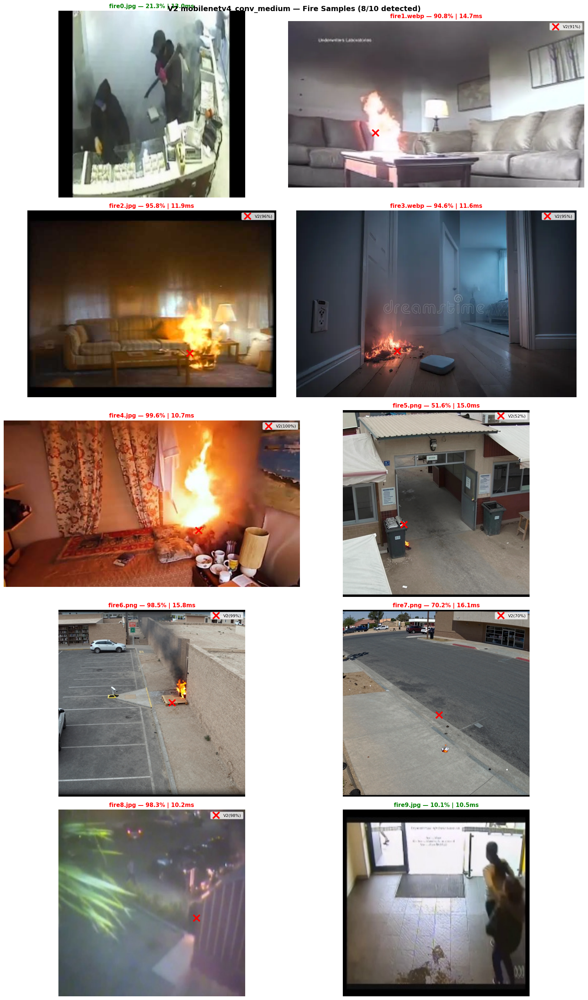

/kaggle/working/v2_fire_samples.png

In [6]:
# =============================================================================
# CELL 6: SO SÁNH V2 TRÊN FIRE-SAMPLES & BENCHMARK TỐC ĐỘ
# =============================================================================
import os, glob, time
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms

sample_paths = sorted(glob.glob("/kaggle/input/**/fire-samples/*.*", recursive=True))
if not sample_paths:
    sample_paths = sorted(glob.glob("/kaggle/input/**/*fire[0-9].*", recursive=True))
if not sample_paths:
    sample_paths = sorted(glob.glob("./**/fire-samples/*.*", recursive=True))
if not sample_paths:
    sample_paths = sorted(glob.glob("./*fire*.*", recursive=True))

if not sample_paths:
    print("⚠️ Không tìm thấy thư mục fire-samples. Bỏ qua cell này.")
else:
    print(f"📂 Tìm thấy {len(sample_paths)} ảnh fire-samples để kiểm tra thực tế:")
    model.eval()
    vtfm = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(MEAN, STD),
    ])
    report = []
    for path in sample_paths:
        fname = os.path.basename(path)
        img = Image.open(path).convert("RGB")
        W, H = img.size
        t0 = time.time()
        with torch.no_grad():
            pred = model(vtfm(img).unsqueeze(0).to(device)).squeeze(0).cpu().numpy()
        ms = (time.time() - t0) * 1000
        pf = float(pred[0])
        pt = (round(float(pred[1]), 4), round(float(pred[2]), 4)) if pf >= 0.5 else None
        report.append({"name": fname, "img": img, "W": W, "H": H, "p_fire": pf, "v2_pt": pt, "ms": ms})

    print("\n" + "═" * 75)
    for r in report:
        pts = f"({r['v2_pt'][0]:.2f}, {r['v2_pt'][1]:.2f})" if r["v2_pt"] else "—"
        st = "🔥 CÓ LỬA" if r["p_fire"] >= 0.5 else "🌿 KHÔNG LỬA"
        print(f"  {r['name']:<20} {r['p_fire']*100:>5.1f}% {st} | Pos: {pts:<18} | {r['ms']:.1f}ms")
    det = sum(1 for r in report if r["p_fire"] >= 0.5)
    print(f"\n⭐ Phát hiện: {det}/{len(report)} | Tốc độ TB: {np.mean([r['ms'] for r in report]):.1f}ms/ảnh")
    print("═" * 75)

    rows = (len(report) + 1) // 2
    fig, axes = plt.subplots(rows, 2, figsize=(16, 5.5 * rows))
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    for i, r in enumerate(report):
        axes[i].imshow(r["img"])
        if r["v2_pt"]:
            axes[i].scatter([r["v2_pt"][0] * r["W"]], [r["v2_pt"][1] * r["H"]],
                           color="red", s=160, marker="x", linewidth=3,
                           label=f"V2({r['p_fire']*100:.0f}%)", zorder=5)
        tc = "red" if r["p_fire"] >= 0.5 else "green"
        axes[i].set_title(f"{r['name']} — {r['p_fire']*100:.1f}% | {r['ms']:.1f}ms",
                         fontsize=11, fontweight="bold", color=tc)
        axes[i].axis("off")
        if r["v2_pt"]:
            axes[i].legend(loc="upper right", fontsize=8)
    for j in range(len(report), len(axes)):
        axes[j].axis("off")
    plt.suptitle(f"V2 {BACKBONE} — Fire Samples ({det}/{len(report)} detected)", fontsize=14, fontweight="bold")
    plt.tight_layout()
    fire_samples_save_path = os.path.join(SAVE_DIR, "v2_fire_samples.png")
    plt.savefig(fire_samples_save_path, dpi=130, bbox_inches="tight")
    plt.show()

    try:
        from IPython.display import FileLink, display
        display(FileLink("v2_fire_samples.png"))
    except Exception:
        pass
